#import libraries

In [ ]:
import numpy as np
import pandas as pd

import seaborn as sns
import plotly.express as px
import matplotlib.pyplot as plt
%matplotlib inline

from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.metrics import euclidean_distances
from scipy.spatial.distance import cdist

import warnings
warnings.filterwarnings("ignore")

# import data

In [ ]:
data = pd.read_csv('data.csv')
genre_data = pd.read_csv('data_by_genres.csv')
year_data = pd.read_csv('data_by_year.csv')

# print(data.info())


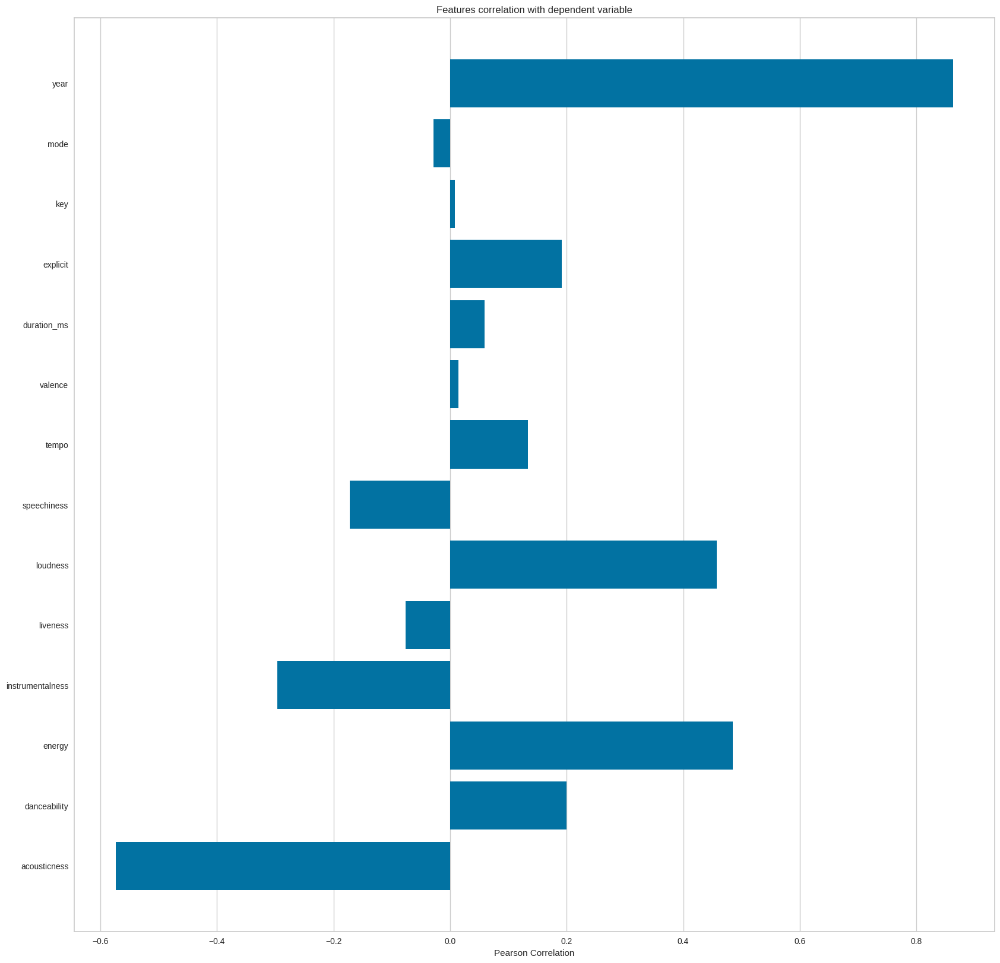

<Axes: title={'center': 'Features correlation with dependent variable'}, xlabel='Pearson Correlation'>

In [ ]:
from yellowbrick.target import FeatureCorrelation

feature_names = ['acousticness', 'danceability', 'energy', 'instrumentalness',
       'liveness', 'loudness', 'speechiness', 'tempo', 'valence','duration_ms','explicit','key','mode','year']

X, y = data[feature_names], data['popularity']

# Create a list of the feature names
features = np.array(feature_names)

# Instantiate the visualizer
visualizer = FeatureCorrelation(labels=features)

plt.rcParams['figure.figsize']=(20,20)
visualizer.fit(X, y)     # Fit the data to the visualizer
visualizer.show()

<Axes: xlabel='count', ylabel='decade'>

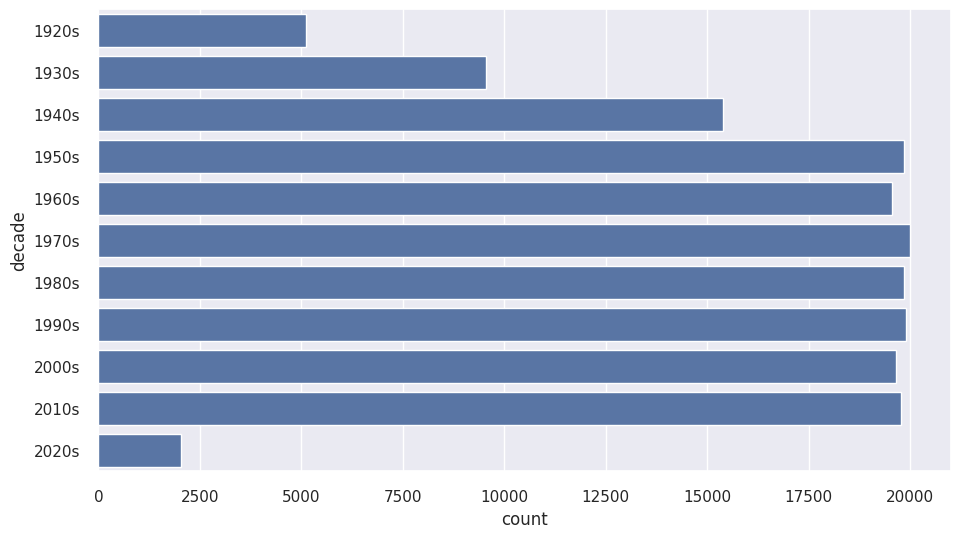

In [ ]:
def get_decade(year):
    period_start = int(year/10) * 10
    decade = '{}s'.format(period_start)
    return decade

data['decade'] = data['year'].apply(get_decade)

sns.set(rc={'figure.figsize':(11 ,6)})
sns.countplot(data['decade'])

In [ ]:
sound_features = ['acousticness', 'danceability', 'energy', 'instrumentalness', 'liveness', 'valence']
fig = px.line(year_data, x='year', y=sound_features)
fig.show()

In [ ]:
top10_genres = genre_data.nlargest(10, 'popularity')

fig = px.bar(top10_genres, x='genres', y=['valence', 'energy', 'danceability', 'acousticness'], barmode='group')
fig.show()

clustering Genres with K-Means

In [ ]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.pipeline import make_pipeline

# Create the pipeline using make_pipeline
cluster_pipeline = make_pipeline(StandardScaler(), KMeans(n_clusters=10, random_state=42))

# Assuming genre_data is a pandas DataFrame
X = genre_data.select_dtypes(include=[np.number])

# Fit the pipeline and predict in one step
genre_data['cluster'] = cluster_pipeline.fit_predict(X)

# If you need the fitted pipeline for later use
fitted_pipeline = cluster_pipeline


In [ ]:
from sklearn.manifold import TSNE

tsne_pipeline = Pipeline([('scaler', StandardScaler()), ('tsne', TSNE(n_components=2, verbose=1))])
genre_embedding = tsne_pipeline.fit_transform(X)
projection = pd.DataFrame(columns=['x', 'y'], data=genre_embedding)
projection['genres'] = genre_data['genres']
projection['cluster'] = genre_data['cluster']

fig = px.scatter(
    projection, x='x', y='y', color='cluster', hover_data=['x', 'y', 'genres'])
fig.show()

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 2973 samples in 0.005s...
[t-SNE] Computed neighbors for 2973 samples in 0.329s...
[t-SNE] Computed conditional probabilities for sample 1000 / 2973
[t-SNE] Computed conditional probabilities for sample 2000 / 2973
[t-SNE] Computed conditional probabilities for sample 2973 / 2973
[t-SNE] Mean sigma: 0.811142
[t-SNE] KL divergence after 250 iterations with early exaggeration: 71.822533
[t-SNE] KL divergence after 1000 iterations: 1.195656


cluster songs with K-Means

In [ ]:
song_cluster_pipeline = make_pipeline(
    StandardScaler(),
    KMeans(
          n_clusters=20,
        random_state=42,
        n_init='auto',
        init='k-means++',
        algorithm='elkan',
    )
)

# Assuming 'data' is a pandas DataFrame
X = data.select_dtypes(include=[np.number])

# Store column names if needed
number_cols = X.columns.tolist()

# Fit the pipeline and predict in one step
data['cluster_label'] = song_cluster_pipeline.fit_predict(X)

# If you need the fitted pipeline for later use
fitted_pipeline = song_cluster_pipeline

In [ ]:
from sklearn.decomposition import PCA

pca_pipeline = Pipeline([('scaler', StandardScaler()), ('PCA', PCA(n_components=2))])
song_embedding = pca_pipeline.fit_transform(X)
projection = pd.DataFrame(columns=['x', 'y'], data=song_embedding)
projection['title'] = data['name']
projection['cluster'] = data['cluster_label']

fig = px.scatter(
    projection, x='x', y='y', color='cluster', hover_data=['x', 'y', 'title'])
fig.show()

In [ ]:
!pip install spotipy

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 261.3/261.3 kB 12.0 MB/s eta 0:00:00


In [152]:
import spotipy
from spotipy.oauth2 import SpotifyClientCredentials
from collections import defaultdict
import os

sp = spotipy.Spotify(auth_manager=SpotifyClientCredentials(client_id=client_id, client_secret=client_secret))

def find_song(name, year):
    song_data = defaultdict()
    results = sp.search(q= 'track: {} year: {}'.format(name,year), limit=1)
    if results['tracks']['items'] == []:
        return None

    results = results['tracks']['items'][0]
    track_id = results['id']
    audio_features = sp.audio_features(track_id)[0]

    song_data['name'] = [name]
    song_data['year'] = [year]
    song_data['explicit'] = [int(results['explicit'])]
    song_data['duration_ms'] = [results['duration_ms']]
    song_data['popularity'] = [results['popularity']]

    for key, value in audio_features.items():
        song_data[key] = value

    return pd.DataFrame(song_data)


NameError: name 'client_id' is not defined

In [ ]:
import numpy as np
from collections import defaultdict
from scipy.spatial.distance import cdist
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.pipeline import make_pipeline

number_cols = ['valence', 'year', 'acousticness', 'danceability', 'duration_ms', 'energy', 'explicit',
               'instrumentalness', 'key', 'liveness', 'loudness', 'mode', 'popularity', 'speechiness', 'tempo']

def get_song_data(song, spotify_data):
    return spotify_data[(spotify_data['name'] == song['name']) &
                        (spotify_data['year'] == song['year'])].iloc[0]

def get_mean_vector(song_list, spotify_data):
    song_vectors = []
    for song in song_list:
        try:
            song_data = get_song_data(song, spotify_data)
            song_vector = song_data[number_cols].values
            song_vectors.append(song_vector)
        except IndexError:
            print(f"Warning: {song['name']} does not exist in database")
    return np.mean(song_vectors, axis=0) if song_vectors else None

def flatten_dict_list(dict_list):
    flattened_dict = defaultdict(list)
    for dictionary in dict_list:
        for key, value in dictionary.items():
            flattened_dict[key].append(value)
    return flattened_dict

def recommend_songs(song_list, spotify_data, n_songs=10):
    metadata_cols = ['name', 'year', 'artists']
    song_dict = flatten_dict_list(song_list)

    song_center = get_mean_vector(song_list, spotify_data)
    if song_center is None:
        return []

    song_cluster_pipeline.fit(spotify_data[number_cols])

    scaler = song_cluster_pipeline.named_steps['standardscaler']
    scaled_data = scaler.transform(spotify_data[number_cols])
    scaled_song_center = scaler.transform(song_center.reshape(1, -1))
    distances = cdist(scaled_song_center, scaled_data, 'cosine')
    index = np.argsort(distances)[0][:n_songs]

    rec_songs = spotify_data.iloc[index]
    rec_songs = rec_songs[~rec_songs['name'].isin(song_dict['name'])]
    return rec_songs[metadata_cols].to_dict(orient='records')


In [ ]:
# prompt: call the recommend_songs function

song_list = [{'name': 'Disfruto Lo Malo', 'year':2019}]

recommended_songs = recommend_songs(song_list, data)

print(recommended_songs)

[{'name': "Summer Feelings (feat. Charlie Puth) - From 'SCOOB!' The Album", 'year': 2020, 'artists': "['Lennon Stella', 'Charlie Puth']"}, {'name': 'DEL Negociante', 'year': 2016, 'artists': "['Los Plebes del Rancho de Ariel Camacho']"}, {'name': 'Tú', 'year': 2020, 'artists': "['Los Elegantes de Jerez']"}, {'name': "Talkin' Tennessee", 'year': 2018, 'artists': "['Morgan Wallen']"}, {'name': 'Level of Concern', 'year': 2020, 'artists': "['Twenty One Pilots']"}, {'name': 'Soberbio', 'year': 2012, 'artists': "['Romeo Santos']"}, {'name': "Sure Don't Miss You", 'year': 2019, 'artists': "['The Dip']"}, {'name': 'Ladeando (feat. Fuerza Regida)', 'year': 2018, 'artists': "['Herencia de Patrones', 'Fuerza Regida']"}, {'name': 'La Escuela No Me Gustó', 'year': 2018, 'artists': "['Adriel Favela', 'Javier Rosas']"}]
